<a id="1"></a>
<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Project 4: West Nile Virus Classification

## Part 1: Data Cleaning, Preprocessing and EDA (Train, Test, & Spray Dataset)

### Contents:
- [Background](#Background)
- [Problem Statement](#Problem-Statement)
- [Data Import](#Data-Import)
- [Data Cleaning](#Data-Cleaning)
- [Preprocessing and EDA](#Preprocessing-and-EDA)
- [Feature Engineering](#Feature-Engineering)

## Background

West Nile virus (WNV) (Flaviviridae: Flavivirus) is an arbovirus circulating among mosquitoes, which serve as the vectors, and wild birds, which serve as the main reservoir hosts. WNV raises public health concerns for its ability to infect humans, which are considered dead-end hosts due to our inability to develop a sufficient viremia to infect mosquitoes. So, environmental surveillance, particularly surveillance based on mosquito sampling, can provide early detection of the virus circulation before the onset of the disease in humans.

WMV is the leading cause of mosquito-borne disease in the continental United States. It is most commonly spread to people by the bite of an infected mosquito. Cases of WNV occur during mosquito season, which starts in the summer and continues through fall. There are no vaccines to prevent or medications to treat WNV in people. Fortunately, most people infected with WNV do not feel sick. About 1 in 5 people who are infected develop a fever and other symptoms. About 1 out of 150 infected people develop a serious, sometimes fatal, illness. ([source](https://www.cdc.gov/westnile/prevention/index.html))

There is no vaccine to prevent WNV infection. The best way to prevent WNV is to protect yourself from mosquito bites. Use insect repellent, wear long-sleeved shirts and pants, treat clothing and gear, and take steps to control mosquitoes indoors and outdoors.

In 2002, the first human cases of West Nile virus were reported in Chicago. By 2004 the City of Chicago and the Chicago Department of Public Health (CDPH) had established a comprehensive surveillance and control program that is still in effect today. Every week from late spring through the fall, mosquitos in traps across the city are tested for the virus. The results of these tests influence when and where the city will spray airborne pesticides to control adult mosquito populations.

So, every year, from late-May to early-October, public health workers in Chicago setup mosquito traps scattered across the city. Every week from Monday through Wednesday, these traps collect mosquitoes, and the mosquitoes are tested for the presence of West Nile virus before the end of the week. The test results include the number of mosquitoes, the mosquitoes species, and whether or not West Nile virus is present in the cohort.

## Problem Statement

Given weather, location, testing, and spraying data, we are tasked to predict when and where different species of mosquitos will test positive for West Nile virus. A more accurate method of predicting outbreaks of West Nile virus in mosquitos will help the City of Chicago and CPHD more efficiently and effectively allocate resources towards preventing transmission of this potentially deadly virus.

In [1]:
#!pip install haversine

In [2]:
#!pip install geopy

In [3]:
#!pip install folium

In [4]:
# Import libraries
import numpy as np
import pandas as pd
import re
import pickle

# Pandas settings
pd.set_option('display.max_rows', None)
pd.set_option("display.max_columns", None)
pd.options.mode.chained_assignment = None  # default='warn'

from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Time Series imports
import datetime as dt
from datetime import datetime
import pytz
import suntime as st
import haversine as hs

# Plotting imports
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
plt.style.use('ggplot')
%matplotlib inline
import geopandas as gpd
import geopy.distance
import plotly.express as px
from shapely.geometry import Point, Polygon

#Imports for geospatial visualizations
import folium
from folium.plugins import HeatMapWithTime, MarkerCluster
from branca.element import Figure
from mpl_toolkits.axes_grid1 import host_subplot
from mpl_toolkits import axisartist



#import descartes
#from mpl_toolkits.axes_grid1 import host_subplot
#from mpl_toolkits import axisartist
#from geopy.geocoders import Nominatim

/Users/lektiekleong/opt/anaconda3/lib/python3.9/site-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


## Data Import

Data from Kaggle:

spray.csv: this is the GIS data for the City of Chicago's spray efforts in 2011 and 2013<br/>
weather.csv: this contains weather conditions of 2007 to 2014, during the months of the tests, from NOAA<br/>
train.csv: this is the training dataset<br/>
test.csv: this is the test dataset<br/>

In [5]:
# Import Data
spray = pd.read_csv('../data/spray.csv')
train = pd.read_csv('../data/train.csv')
test = pd.read_csv('../data/test.csv')

## Data Cleaning

In [6]:
# Function to get some basic information about each dataframe
def basic_eda(df, df_name):
    print(df_name.upper())
    print()
    print(f"{df_name}.info")
    print(df.info())
    print()
    print(f"Total null rows: {df.isnull().sum().sum()}")
    print(f"Percentage null rows: {round(df.isnull().sum().sum() / df.shape[0] * 100, 2)}%")
    print()
    print(f"Total duplicate rows: {df[df.duplicated(keep=False)].shape[0]}")
    print(f"Percentage dupe rows: {round(df[df.duplicated(keep=False)].shape[0] / df.shape[0] * 100, 2)}%")
    print()
    print(f"Unique values")
    for col in df.columns:
        print(f"{col}:")
        print(df[col].unique())
        print('\n')
    print("-----\n")

In [7]:
# Function to clean datasets
def clean_data(df, df_name):
    print(df_name.upper())
    print()
    # make columns lowercase
    df.columns = df.columns.str.lower()
    # Converting dtype of 'date' column to 'datetime'
    df['date'] = pd.to_datetime(df['date'])
    # Creating year, month and day variable from date
    df['year'] = df['date'].dt.year 
    df['month'] = df['date'].dt.month
    df['day'] = df['date'].dt.day
    print(df.info())
    print("-----\n")

In [8]:
dfs = [
    (train, 'train'),
    (test, 'test'),
    (spray, 'spray')
    ]

In [9]:
# Get some basic information about each dataframe
[basic_eda(df, name) for df, name in dfs]

TRAIN

train.info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10506 entries, 0 to 10505
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Date                    10506 non-null  object 
 1   Address                 10506 non-null  object 
 2   Species                 10506 non-null  object 
 3   Block                   10506 non-null  int64  
 4   Street                  10506 non-null  object 
 5   Trap                    10506 non-null  object 
 6   AddressNumberAndStreet  10506 non-null  object 
 7   Latitude                10506 non-null  float64
 8   Longitude               10506 non-null  float64
 9   AddressAccuracy         10506 non-null  int64  
 10  NumMosquitos            10506 non-null  int64  
 11  WnvPresent              10506 non-null  int64  
dtypes: float64(2), int64(4), object(6)
memory usage: 985.1+ KB
None

Total null rows: 0
Percentage null rows: 0.0%

Total duplicat

Total null rows: 0
Percentage null rows: 0.0%

Total duplicate rows: 0
Percentage dupe rows: 0.0%

Unique values
Id:
[     1      2      3 ... 116291 116292 116293]


Date:
['2008-06-11' '2008-06-17' '2008-06-24' '2008-07-01' '2008-07-04'
 '2008-07-11' '2008-07-14' '2008-07-21' '2008-07-23' '2008-07-24'
 '2008-07-28' '2008-07-29' '2008-08-04' '2008-08-05' '2008-08-12'
 '2008-08-13' '2008-08-19' '2008-08-25' '2008-08-26' '2008-09-02'
 '2008-09-03' '2008-09-09' '2008-09-15' '2008-09-19' '2008-09-29'
 '2010-06-02' '2010-06-11' '2010-06-18' '2010-06-25' '2010-06-28'
 '2010-07-01' '2010-07-02' '2010-07-12' '2010-07-13' '2010-07-16'
 '2010-07-19' '2010-07-23' '2010-07-26' '2010-07-29' '2010-07-30'
 '2010-08-05' '2010-08-06' '2010-08-13' '2010-08-19' '2010-08-20'
 '2010-08-26' '2010-08-27' '2010-09-02' '2010-09-10' '2010-09-13'
 '2010-09-16' '2010-09-17' '2010-09-23' '2010-09-24' '2010-10-01'
 '2012-06-08' '2012-06-15' '2012-06-21' '2012-06-29' '2012-07-09'
 '2012-07-13' '2012-07-19' '2012-07

[None, None, None]

In [10]:
# Clean each dataframe
[clean_data(df, name) for df, name in dfs]

TRAIN

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10506 entries, 0 to 10505
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date                    10506 non-null  datetime64[ns]
 1   address                 10506 non-null  object        
 2   species                 10506 non-null  object        
 3   block                   10506 non-null  int64         
 4   street                  10506 non-null  object        
 5   trap                    10506 non-null  object        
 6   addressnumberandstreet  10506 non-null  object        
 7   latitude                10506 non-null  float64       
 8   longitude               10506 non-null  float64       
 9   addressaccuracy         10506 non-null  int64         
 10  nummosquitos            10506 non-null  int64         
 11  wnvpresent              10506 non-null  int64         
 12  year                    10506 non-null 

[None, None, None]

[Back to top](#1)

## Preprocessing and EDA

### Train dataset

As observed, the train dataset has 10,506 entries and 12 columns. We also found that this dataset has 1062 duplicate entries. This is due to data entry structure as outlined in Kaggle as below, and we will deal with this later.
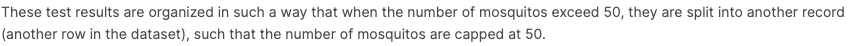

The location of the traps are described by the block number and street name. For your convenience, we have mapped these attributes into Longitude and Latitude in the dataset. Please note that these are derived locations. For example, Block=79, and Street= "W FOSTER AVE" gives us an approximate address of "7900 W FOSTER AVE, Chicago, IL", which translates to (41.974089,-87.824812) on the map.

Some traps are "satellite traps". These are traps that are set up near (usually within 6 blocks) an established trap to enhance surveillance efforts. Satellite traps are postfixed with letters. For example, T220A is a satellite trap to T220. 

In [11]:
# Plot the traps on the map using plotly+mapbox

fig = px.scatter_mapbox(
    train,  # Train dataframe
    lat = "latitude",
    lon = "longitude",
    center = {"lat": 41.83, "lon": -87.7}, # where map will be centered
    zoom = 10,
    width = 600,  # Width of map
    height = 600,  # Height of map
    hover_data = ["species", "wnvpresent", "date"],  # what to display when hovering mouse over coordinate
)

fig.update_layout(mapbox_style="open-street-map") # adding beautiful street layout to map

fig.show()

<b>Combine Number of Mosquitos</b>

We have noted that the maximum number of mosquitos in a row is 50, and multiple traps may exist for the same location. As such, we combine the number of mosquitos caught based on the traps. We will combine all duplicate rows with the number of mosquitos = 50, and drop those duplicate rows for number of mosquitos < 50.

In [12]:
df_less50 = train.loc[(train.nummosquitos < 50)]
df_less50.shape

(9487, 15)

In [13]:
df_50 = train.loc[(train.nummosquitos == 50)]
df_50.shape

(1019, 15)

In [14]:
# Check for duplicate entries for nummosquitos < 50
duplicateRowsDF = df_less50[df_less50.duplicated()]
print(duplicateRowsDF)

            date                                            address  \
99    2007-06-26     2200 West 113th Street, Chicago, IL 60643, USA   
512   2007-07-18  3300 West Randolph Street, Chicago, IL 60612, USA   
819   2007-08-01     2200 West 113th Street, Chicago, IL 60643, USA   
854   2007-08-01   7500 North Oakley Avenue, Chicago, IL 60645, USA   
857   2007-08-01   7500 North Oakley Avenue, Chicago, IL 60645, USA   
861   2007-08-01     1500 North Long Avenue, Chicago, IL 60651, USA   
886   2007-08-01  4900 West Balmoral Avenue, Chicago, IL 60630, USA   
890   2007-08-01  5800 North Western Avenue, Chicago, IL 60659, USA   
905   2007-08-01  University of Illinois at Chicago, 1100 South ...   
934   2007-08-01                                   Chicago, IL, USA   
977   2007-08-01      4600 Milwaukee Avenue, Chicago, IL 60630, USA   
996   2007-08-01  2700 South Western Avenue, Chicago, IL 60608, USA   
1000  2007-08-01    6800 West Belden Avenue, Chicago, IL 60707, USA   
1012  

In [15]:
# Drop duplicated rows with nummosquitos < 50
df_less50 = df_less50.drop_duplicates()
df_less50.shape

(9381, 15)

In [16]:
# Concat df_50 and df_less50
train = pd.concat([df_50, df_less50], axis =0)
train.shape

(10400, 15)

In [17]:
# Merging number of mosquitos  
duplicate_list = ['date','address','species','block','street','trap','addressnumberandstreet','latitude','longitude','addressaccuracy','wnvpresent','year','month','day']
# Adding nummosquitos for duplicate rows
train = pd.DataFrame(train.groupby(by= duplicate_list, axis=0).sum())
# Reset all columns out from being index
train.reset_index(inplace=True)
train.shape

(8610, 15)

In [18]:
# Total number of mosquitos in perticular area divided based on Address 
total_mosquito = train.groupby(['address'], as_index = False)[['nummosquitos']].sum()

# grouping areas based on 'Latitude'and 'Longitude' of the Address
areas = train.groupby(['address'], as_index = False)[['latitude','longitude']].median()

# Number of virus found in these areas
virus = train.groupby(['address'], as_index = False)[['wnvpresent']].sum() 

# creating a dataframe with total_mosquito, areas, virus as columns
exploratory_data = pd.concat([total_mosquito, areas, virus], axis = 1)

exploratory_data.drop('address', axis = 1, inplace = True)
exploratory_data

,nummosquitos,latitude,longitude,wnvpresent
0,850,41.773215,-87.600880,4
1,1800,41.899230,-87.716788,7
2,119,41.869107,-87.696293,0
3,181,41.721474,-87.648064,1
4,662,41.903002,-87.688267,4
5,1796,41.867108,-87.654224,4
6,997,41.868142,-87.696269,3
7,135,41.862292,-87.648860,1
8,114,41.869216,-87.627561,0
9,260,41.896282,-87.655232,1


In [19]:
fig = px.scatter_mapbox(exploratory_data, lat = 'latitude', lon  = 'longitude', 
                        color = 'nummosquitos', size = 'wnvpresent', 
                        color_continuous_scale=px.colors.sequential.Jet,
                        hover_data = ['nummosquitos', 'wnvpresent'], zoom = 9)
fig.update_layout(title = 'No. of WN virus Vs mosquitos', mapbox_style="open-street-map",
                autosize=False, width=600, height=600,)

fig.show()

It can be seen that there are two locations having higher mosquito count (represented by color map) and same locations also have higher WN virus count(represented by size of the marker).

Orange region has mosquito count = 15184 and WN virus count = 29, while brown region has mosquito count = 21668 and WN virus count = 15.

As observed, having higher mosquito count does not equate to higher WN virus count. We will use percentage of WN virus instead to observe the virus in different locations.

In [20]:
# Percentage of WN Virus in various location
exploratory_data['virus_pct'] = exploratory_data['wnvpresent']/exploratory_data['nummosquitos']

In [21]:
fig = px.scatter_mapbox(exploratory_data, lat = 'latitude', lon  = 'longitude',
                        size = 'virus_pct', zoom = 9)

fig.update_layout(title = 'Percentage of WN virus in different locations', mapbox_style="open-street-map",
                autosize=False, width=600, height=600,)

fig.show()

<b>Combine Traps</b>

As outlined in Kaggle, some traps are "satellite traps". These are traps that are set up near (usually within 6 blocks) an established trap to enhance surveillance efforts. Satellite traps are postfixed with letters. For example, T220A is a satellite trap to T220. 

To facilitate processing, we will combine the satellite and established trap.

In [22]:
# Function to combine satellite traps
def combine_trap(row):
    row['trap'] = (re.sub(pattern='[a-zA-Z]$', repl='', string=row['trap']))
    return row

In [23]:
# combine traps for train dataset
train = train.apply(combine_trap, axis=1)

In [24]:
train['trap'].unique()

array(['T048', 'T091', 'T049', 'T153', 'T045', 'T094', 'T050', 'T054',
       'T086', 'T096', 'T046', 'T002', 'T007', 'T143', 'T148', 'T015',
       'T159', 'T129', 'T092', 'T033', 'T149', 'T150', 'T154', 'T152',
       'T147', 'T158', 'T011', 'T218', 'T019', 'T142', 'T146', 'T135',
       'T220', 'T025', 'T031', 'T141', 'T028', 'T151', 'T016', 'T009',
       'T162', 'T145', 'T089', 'T090', 'T088', 'T085', 'T047', 'T219',
       'T040', 'T051', 'T034', 'T043', 'T001', 'T003', 'T006', 'T012',
       'T037', 'T008', 'T161', 'T030', 'T160', 'T018', 'T084', 'T144',
       'T013', 'T014', 'T095', 'T044', 'T017', 'T005', 'T073', 'T039',
       'T061', 'T069', 'T060', 'T035', 'T062', 'T074', 'T081', 'T036',
       'T075', 'T004', 'T082', 'T114', 'T070', 'T076', 'T071', 'T155',
       'T077', 'T066', 'T079', 'T067', 'T080', 'T083', 'T065', 'T212',
       'T063', 'T215', 'T209', 'T115', 'T206', 'T138', 'T200', 'T128',
       'T107', 'T072', 'T027', 'T078', 'T156', 'T099', 'T100', 'T097',
      

In [25]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8610 entries, 0 to 8609
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date                    8610 non-null   datetime64[ns]
 1   address                 8610 non-null   object        
 2   species                 8610 non-null   object        
 3   block                   8610 non-null   int64         
 4   street                  8610 non-null   object        
 5   trap                    8610 non-null   object        
 6   addressnumberandstreet  8610 non-null   object        
 7   latitude                8610 non-null   float64       
 8   longitude               8610 non-null   float64       
 9   addressaccuracy         8610 non-null   int64         
 10  wnvpresent              8610 non-null   int64         
 11  year                    8610 non-null   int64         
 12  month                   8610 non-null   int64   

<b>WN virus distribution</b>

In [26]:
# Check distribution for WnvPresent
train.wnvpresent.value_counts(normalize=True)

0    0.946922
1    0.053078
Name: wnvpresent, dtype: float64

94.7% of the data consists of WnvPresent == 0
The data is severely imbalanced. Consider imbalanced data manipulation such as under-sampling the majority class, or over-sampling the minority class.

Since the presense of West Nile Virus is our primary concern, WnvPresent == 1 shall be the positive class.
Hence, we will be over-sampling the minority class in this project.

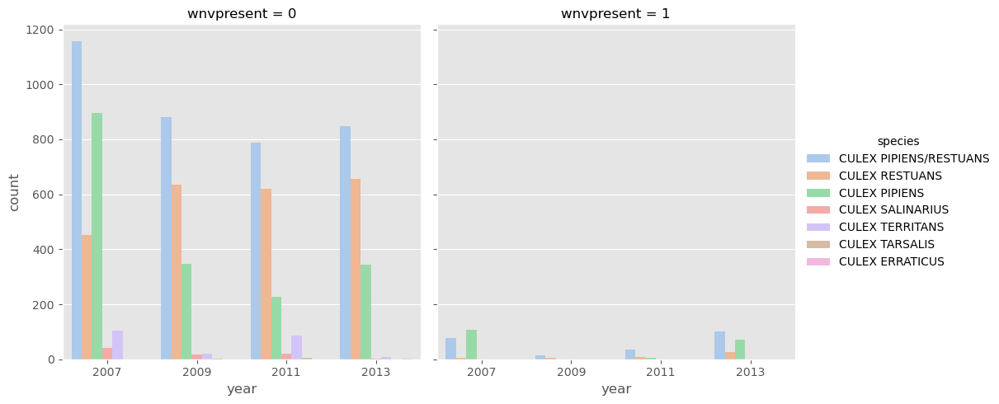

In [27]:
# Plot bar charts for Species
sns.catplot(data=train, 
           x='year',
           hue='species',
           col='wnvpresent',
           kind='count', palette='pastel')

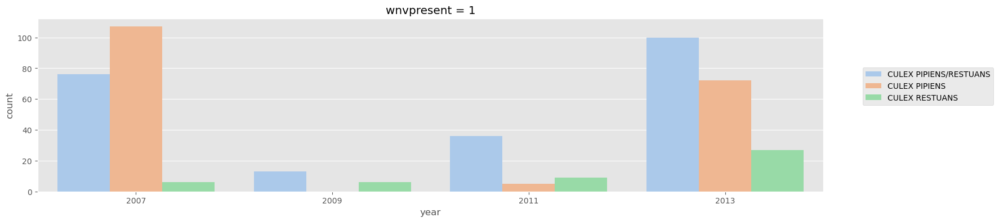

In [28]:
# Further analyse the distribution of WNV positive samples over the years
plt.figure(figsize=(18,4),dpi=100)
sns.countplot(data=train[train['wnvpresent']==1], x='year',hue='species',palette='pastel')
plt.legend(loc=(1.05,0.5))
plt.title('wnvpresent = 1')
plt.show();

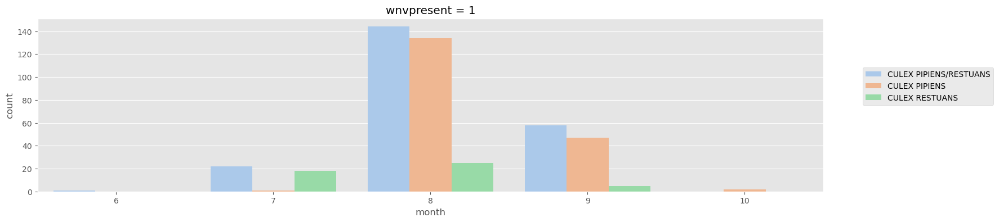

In [29]:
# Further analyse the distribution of WNV positive samples over the months
plt.figure(figsize=(18,4),dpi=100)
sns.countplot(data=train[train['wnvpresent']==1], x='month',hue='species',palette='pastel')
plt.legend(loc=(1.05,0.5))
plt.title('wnvpresent = 1')
plt.show();

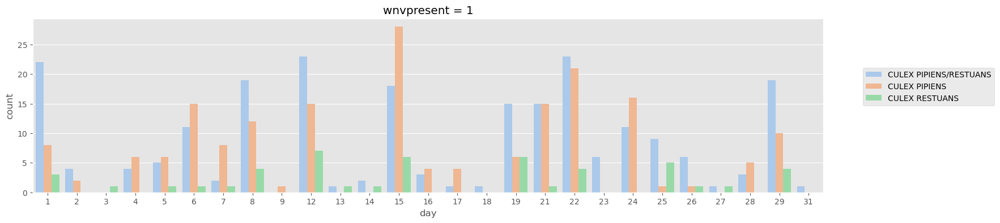

In [30]:
# Further analyse the distribution of WNV positive samples by days
plt.figure(figsize=(18,4),dpi=100)
sns.countplot(data=train[train['wnvpresent']==1], x='day',hue='species',palette='pastel')
plt.legend(loc=(1.05,0.5))
plt.title('wnvpresent = 1')
plt.show();

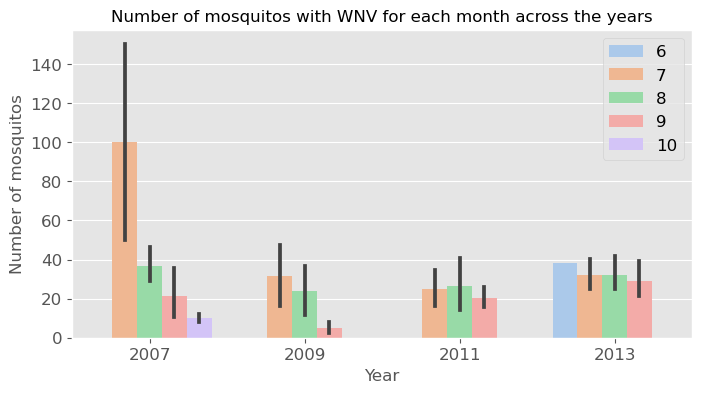

In [31]:
plt.figure(figsize=(8,4))
plt.title('Number of mosquitos with WNV for each month across the years', fontsize=12)
sns.barplot(x='year',y='nummosquitos',hue='month',data= train[train['wnvpresent']==1], palette='pastel')
plt.ylabel('Number of mosquitos', fontsize=12)
plt.xlabel('Year', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12);

#### Quick observations from grouping year and month

It is interesting to note that for year 2011 and 2013, there is no data for the months of May and October. For Aug 2007, the number of mosquitoes are extremely high, compared to other months in other years. This is due to the extremely high number of traps deployed for that particular month. 

The number of traps also dropped in the subsequent years, which follows a similar trend in the chart for the number of mosquitoes captured. 

From the dataset, it may seem like the interventions have worked effectively to keep the number of mosquitoes lower. In 2009, the number of mosquitoes grew in June and July and dropped to 1/4 of its numbers in Aug & Sept.

In 2011, we are missing data in May and October, but the numbers in June were comparatively lower than 2009. The spike also occurred in July, and dwindled down to almost 35-40% of its numbers in Aug & Sept.

In 2013, we are also missing data in May and October, but the numbers in July and August were in the range that were unseen for the past 4 years. Even though the numbers in September were lower as compared to earlier months, the numbers were still higher comparatively across the other years. We can dive deeper in the train dataset and cross reference with other datasets such as Spray and Weather to draw some insights on the sudden rise in the number of mosquitoes.

#### Trap Collected Over the Years

In [32]:
#cross reference wnvpresent with month/year & number of traps deployed
trap_count = train.groupby(['year','month','wnvpresent'])['trap'].nunique().reset_index()
trap_total = train.groupby(['year','month'])['trap'].nunique().reset_index()

In [33]:
trap_count

,year,month,wnvpresent,trap
0,2007,5,0,18
1,2007,6,0,66
2,2007,7,0,103
3,2007,7,1,2
4,2007,8,0,115
5,2007,8,1,61
6,2007,9,0,112
7,2007,9,1,20
8,2007,10,0,105
9,2007,10,1,2


In [34]:
trap_total

,year,month,trap
0,2007,5,18
1,2007,6,66
2,2007,7,103
3,2007,8,115
4,2007,9,112
5,2007,10,105
6,2009,5,41
7,2009,6,61
8,2009,7,68
9,2009,8,68


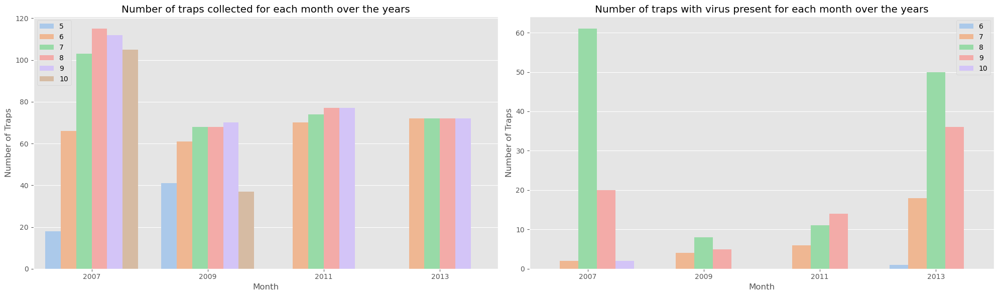

In [35]:
#visualization of number of traps collected for each month over the years
fig, ax = plt.subplots(1,2, figsize=(20, 6))

sns.barplot(x='year',y='trap',hue='month',data= trap_total, palette = 'pastel', ax=ax[0])
ax[0].set_title('Number of traps collected for each month over the years')
ax[0].set_xlabel('Month')
ax[0].set_ylabel('Number of Traps')
ax[0].legend()

sns.barplot(x='year',y='trap',hue='month',data= trap_count.loc[trap_count['wnvpresent'] ==1], palette = 'pastel', ax=ax[1])
ax[1].set_title('Number of traps with virus present for each month over the years')
ax[1].set_xlabel('Month')
ax[1].set_ylabel('Number of Traps')
ax[1].legend()

plt.tight_layout()
plt.show()

In [36]:
#Sum of columns, groupby trap to see if there are any trends
#note that the initial column wnvpresent is a binary column (0/1)
#using sum, we would essentially count the sum of '1's present
#note that the number for wnvpresent column is not reflective of the number West Nile Virus cases
#but the higher the number for wnvpresent column, the higher the number of mosquitos infected with WNV
traps_count = train.groupby('trap').sum()
traps_count

,block,latitude,longitude,addressaccuracy,wnvpresent,year,month,day,nummosquitos
trap,,,,,,,,,
T001,560,587.351870,-1228.275636,112,0,28098,113,166,25
T002,6150,6293.203500,-13170.148650,1350,15,301468,1123,2453,3694
T003,5244,4783.923588,-10004.370846,912,14,229140,874,1784,1345
T004,588,503.552736,-1052.980404,108,0,24084,103,184,59
T005,840,587.189596,-1228.869390,112,2,28098,117,192,50
T006,1440,1007.766816,-2107.131048,192,4,48168,187,367,107
T007,1426,965.884793,-2018.693417,207,0,46161,182,313,77
T008,8050,4830.956110,-10094.460915,1035,9,231143,860,1778,2637
T009,8827,4072.986488,-8521.355979,776,8,194975,732,1531,1940


In [37]:
trap_mos_wnv = traps_count[['nummosquitos', 'wnvpresent']]
trap_mos_wnv.head()

,nummosquitos,wnvpresent
trap,,
T001,25,0
T002,3694,15
T003,1345,14
T004,59,0
T005,50,2


<AxesSubplot:xlabel='wnvpresent', ylabel='nummosquitos'>

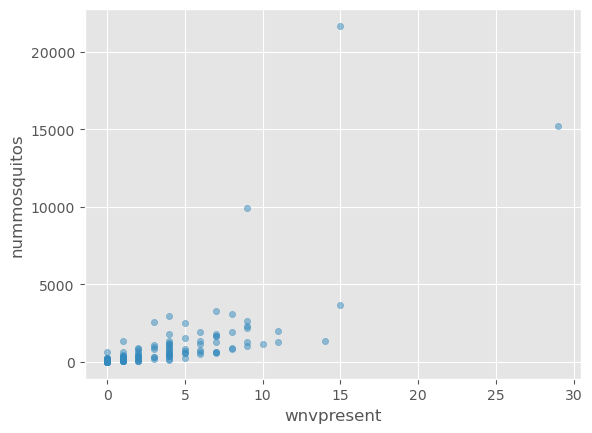

In [38]:
#check out scatter plots for wnv present vs nummosquitos
#we can also identify the outliers, which is key to our study on WNV 
trap_mos_wnv.plot.scatter(x= 'wnvpresent', y = 'nummosquitos', alpha = 0.5)

In [39]:
#identifying the outliers
#high presence of wnv 
trap_mos_wnv[trap_mos_wnv['wnvpresent']>13]

,nummosquitos,wnvpresent
trap,,
T002,3694,15
T003,1345,14
T115,21668,15
T900,15184,29


In [40]:
#identify traps that wnv is not present
trap_mos_wnv[trap_mos_wnv['wnvpresent']==0]

,nummosquitos,wnvpresent
trap,,
T001,25,0
T004,59,0
T007,77,0
T017,232,0
T018,121,0
T019,72,0
T025,71,0
T034,50,0
T040,6,0


We did a filter to identify the traps of the outliers. We can then cross reference the trap identity with its location. We can also see that the top counts of traps also coincides with the presence of West Nile Virus, namely - T900, T115, T002, T138. 

The locations of these traps are as follows: 

- T002 :  4100 North Oak Park Avenue, Chicago, IL 60634, USA (near cemetries)
- T115 : South Doty Avenue, Chicago, IL, USA (Along the freeway, surrounded by Calumet River and lakes, relatively higher concentration of wetlands around the area) 
- T138 : South Stony Island Avenue, Chicago, IL, USA (major street on the South side of teh city of Chicago, runs from 56th street south to the Calumet River)
- T900 : ORD Terminal 5, O'Hare International Airport, Chicago, IL 60666, USA (Airport, next to Schiller Woods) 

A few key questions we should keep at the back of our heads: 
- From the subplots, we can also see that majority of the traps with lower number of mosquitos having presence of West Nile virus. How can we work out the cost-effectiveness of spraying intervention for such wide coverage? 
- Given the limited resources, how do we prioritise the spraying interventions based on locations while maximising the effect of eradicating West Nile Virus?

Culex species that carry WNV:  ['CULEX PIPIENS/RESTUANS' 'CULEX PIPIENS' 'CULEX RESTUANS']


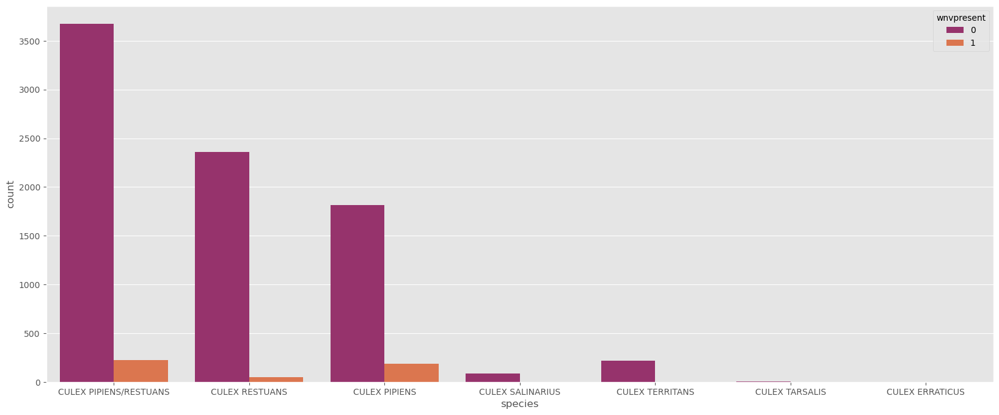

In [41]:
print('Culex species that carry WNV: ', train.query('wnvpresent==1').species.unique())
fig, ax = plt.subplots(figsize=(20,8))
_ = sns.countplot(x='species', data=train, hue='wnvpresent', palette=[ '#A7226E','#F26B38'])

From the above plot, the dominant species carrying the West Nile virus are the `Culex Pipiens`, `Culex Restuans` and `Culex Pipiens/Restuans`. This parameter will be converted to ordinal. The other species will be dropped.

We find that some species has a higher probability of carrying the West Nile Virus than others. In particular, a Culex Pipiens has a higher probability of carrying the virus as compared to Culex Restuans. Accordingly, we rank their probability of carrying the virus in ordinal values as shown in the table below, where a higher value denotes that the species has a higher probability of carrying the virus.

|Species|Probability|Ordinal| Value|
|---|---|---|---|
|Cullex Pipiens|9.22%|3|
|Cullex Pipiens/Restuans|5.77%|2|
|Cullex Restuans|1.99%|1|
|All Others|0.00%|np.nan|

In [42]:
# Map spices to rank -larger value, more likely to have wnvpresent
mspecies = {'CULEX PIPIENS': 3, 'CULEX PIPIENS/RESTUANS': 2, 'CULEX RESTUANS': 1}
train['species'] = train['species'].map(mspecies)

In [43]:
# nan is given for rows of other species
train['species'].unique()

array([ 2.,  1.,  3., nan])

In [44]:
# Replace other species with '0'
train['species'] = train['species'].fillna(0)

Since location features is important in predicting WNV, we will be dropped the below columns and keep latitude, longitude as we belived they have good predictive power of the WNV.

- Address
- AddressNumberAndStreet
- AddressAccuracy
- Street
- Block

In [45]:
# Drop location features
train.drop(columns = ['address', 'addressnumberandstreet', 'addressaccuracy', 'street', 'block'], inplace = True)
train.columns

Index(['date', 'species', 'trap', 'latitude', 'longitude', 'wnvpresent',
       'year', 'month', 'day', 'nummosquitos'],
      dtype='object')

In [46]:
train.head()

,date,species,trap,latitude,longitude,wnvpresent,year,month,day,nummosquitos
0,2007-05-29,2.0,T048,41.867108,-87.654224,0,2007,5,29,1
1,2007-05-29,1.0,T048,41.867108,-87.654224,0,2007,5,29,2
2,2007-05-29,1.0,T091,41.862292,-87.648860,0,2007,5,29,1
3,2007-05-29,1.0,T049,41.896282,-87.655232,0,2007,5,29,1
4,2007-05-29,1.0,T153,41.907645,-87.760886,0,2007,5,29,1


/var/folders/_s/2k6c2y293tl37khbd17nwl100000gn/T/ipykernel_41773/1168597641.py:2: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



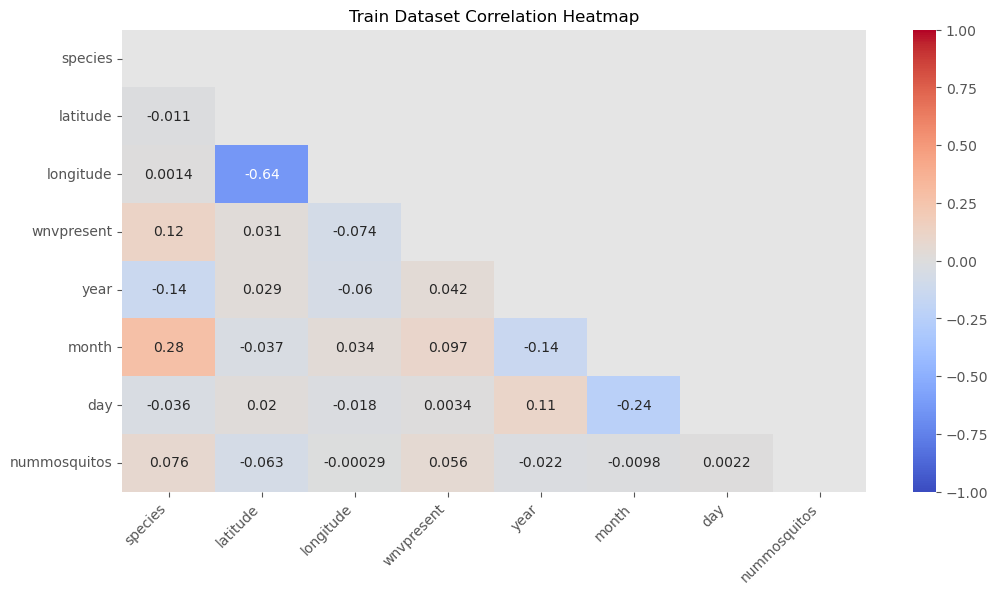

In [47]:
corr = train.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))

plt.figure(figsize=(12,6))
plt.title('Train Dataset Correlation Heatmap',fontsize = 12)
hmap = sns.heatmap(data = corr, vmin = -1, vmax=1, annot=True, mask = mask, cmap='coolwarm');
hmap.set_xticklabels(hmap.get_xticklabels(), rotation=45, horizontalalignment='right');

In [48]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8610 entries, 0 to 8609
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          8610 non-null   datetime64[ns]
 1   species       8610 non-null   float64       
 2   trap          8610 non-null   object        
 3   latitude      8610 non-null   float64       
 4   longitude     8610 non-null   float64       
 5   wnvpresent    8610 non-null   int64         
 6   year          8610 non-null   int64         
 7   month         8610 non-null   int64         
 8   day           8610 non-null   int64         
 9   nummosquitos  8610 non-null   int64         
dtypes: datetime64[ns](1), float64(3), int64(5), object(1)
memory usage: 672.8+ KB


<b>Exporting to csv</b>

In [49]:
# Save cleaned train dataset as a csv file
train.to_csv('../data/train_cleaned.csv', index=False)

[Back to top](#1)

### Test dataset

In [50]:
# Combine traps for test dataset
test = test.apply(combine_trap, axis=1)

In [51]:
test['trap'].unique()

array(['T002', 'T007', 'T015', 'T045', 'T046', 'T048', 'T049', 'T050',
       'T054', 'T086', 'T091', 'T094', 'T096', 'T129', 'T143', 'T148',
       'T153', 'T159', 'T009', 'T011', 'T016', 'T019', 'T025', 'T028',
       'T031', 'T033', 'T089', 'T090', 'T092', 'T135', 'T141', 'T142',
       'T145', 'T146', 'T147', 'T149', 'T150', 'T151', 'T152', 'T154',
       'T158', 'T162', 'T218', 'T220', 'T001', 'T003', 'T006', 'T008',
       'T012', 'T034', 'T037', 'T040', 'T043', 'T047', 'T051', 'T085',
       'T088', 'T161', 'T219', 'T013', 'T014', 'T018', 'T030', 'T084',
       'T144', 'T160', 'T005', 'T017', 'T044', 'T095', 'T004', 'T035',
       'T036', 'T039', 'T060', 'T061', 'T062', 'T065', 'T066', 'T067',
       'T069', 'T070', 'T071', 'T073', 'T074', 'T075', 'T076', 'T077',
       'T079', 'T080', 'T081', 'T082', 'T083', 'T114', 'T155', 'T063',
       'T115', 'T138', 'T200', 'T206', 'T209', 'T212', 'T215', 'T107',
       'T128', 'T072', 'T078', 'T097', 'T099', 'T100', 'T102', 'T103',
      

In [52]:
# Map spices to rank same as train dataset
mspecies = {'CULEX PIPIENS': 3, 'CULEX PIPIENS/RESTUANS': 2, 'CULEX RESTUANS': 1}
test['species'] = test['species'].map(mspecies)

In [53]:
# Replace other species with '0'
test['species'] = test['species'].fillna(0)

In [54]:
test['species'].unique()

array([2., 1., 3., 0.])

In [55]:
# Drop location features
test.drop(columns = ['address', 'addressnumberandstreet', 'addressaccuracy', 'block', 'street'], inplace = True)
test.columns

Index(['id', 'date', 'species', 'trap', 'latitude', 'longitude', 'year',
       'month', 'day'],
      dtype='object')

In [56]:
test.head()

,id,date,species,trap,latitude,longitude,year,month,day
0,1,2008-06-11,2.0,T002,41.95469,-87.800991,2008,6,11
1,2,2008-06-11,1.0,T002,41.95469,-87.800991,2008,6,11
2,3,2008-06-11,3.0,T002,41.95469,-87.800991,2008,6,11
3,4,2008-06-11,0.0,T002,41.95469,-87.800991,2008,6,11
4,5,2008-06-11,0.0,T002,41.95469,-87.800991,2008,6,11


In [57]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 116293 entries, 0 to 116292
Data columns (total 9 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   id         116293 non-null  int64         
 1   date       116293 non-null  datetime64[ns]
 2   species    116293 non-null  float64       
 3   trap       116293 non-null  object        
 4   latitude   116293 non-null  float64       
 5   longitude  116293 non-null  float64       
 6   year       116293 non-null  int64         
 7   month      116293 non-null  int64         
 8   day        116293 non-null  int64         
dtypes: datetime64[ns](1), float64(3), int64(4), object(1)
memory usage: 8.0+ MB


<b>Exporting to csv</b>

In [58]:
# Save cleaned test dataset as a csv file
test.to_csv('../data/test_cleaned.csv', index=False)

[Back to top](#1)

### Spray dataset

In [59]:
#number of duplicated entries

print(f"Total duplicate rows: {spray[spray.duplicated(keep = False)].shape[0]}")
print(f"Percentage dupe rows: {round(spray[spray.duplicated(keep = False)].shape[0]/ spray.shape[0] * 100, 2)}%")

Total duplicate rows: 543
Percentage dupe rows: 3.66%


In [60]:
#check duplicated entry
spray[spray.duplicated(keep = False)]

,date,time,latitude,longitude,year,month,day
484,2011-09-07,7:43:40 PM,41.983917,-87.793088,2011,9,7
485,2011-09-07,7:43:40 PM,41.983917,-87.793088,2011,9,7
489,2011-09-07,7:44:32 PM,41.986460,-87.794225,2011,9,7
490,2011-09-07,7:44:32 PM,41.986460,-87.794225,2011,9,7
491,2011-09-07,7:44:32 PM,41.986460,-87.794225,2011,9,7
492,2011-09-07,7:44:32 PM,41.986460,-87.794225,2011,9,7
493,2011-09-07,7:44:32 PM,41.986460,-87.794225,2011,9,7
494,2011-09-07,7:44:32 PM,41.986460,-87.794225,2011,9,7
495,2011-09-07,7:44:32 PM,41.986460,-87.794225,2011,9,7
496,2011-09-07,7:44:32 PM,41.986460,-87.794225,2011,9,7


As observed, the spray dataset has 14,835 entries and 4 columns, namely Date, Time, Latitude and Longitude. There are 584 null values in the Time column and when we look at these null values, we noticed that the null values are all from spray data on 2011-09-07. We decided to drop the Time column as we believe that the timing of the spray (given that the spray frequency is so high) would not be critical for our data analysis.

The dataset also has 543 duplicate entries. This might be due to system error, and we believe that having duplicated observations are redundant and will not improve our model's predictive power. As such, we have dropped these observations. This results in dropping 543 rows and the "Time" column.

In [61]:
#drop time column 
spray = spray.drop(columns = ['time'])

#drop duplicates
spray = spray.drop_duplicates()

print(spray.info())
spray.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14294 entries, 0 to 14834
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       14294 non-null  datetime64[ns]
 1   latitude   14294 non-null  float64       
 2   longitude  14294 non-null  float64       
 3   year       14294 non-null  int64         
 4   month      14294 non-null  int64         
 5   day        14294 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(3)
memory usage: 781.7 KB
None


date         0
latitude     0
longitude    0
year         0
month        0
day          0
dtype: int64

In [62]:
#check duplicates removed
spray[spray.duplicated()]

,date,latitude,longitude,year,month,day


In [63]:
#number of unique spray dates
print(spray['date'].nunique())
#number of sprays made on each unique date
spray['date'].value_counts()

10


2013-08-15    2668
2013-08-29    2302
2013-07-17    2202
2013-07-25    1607
2013-08-22    1587
2011-09-07    1573
2013-08-08    1195
2013-09-05     924
2013-08-16     141
2011-08-29      95
Name: date, dtype: int64

<AxesSubplot:xlabel='year'>

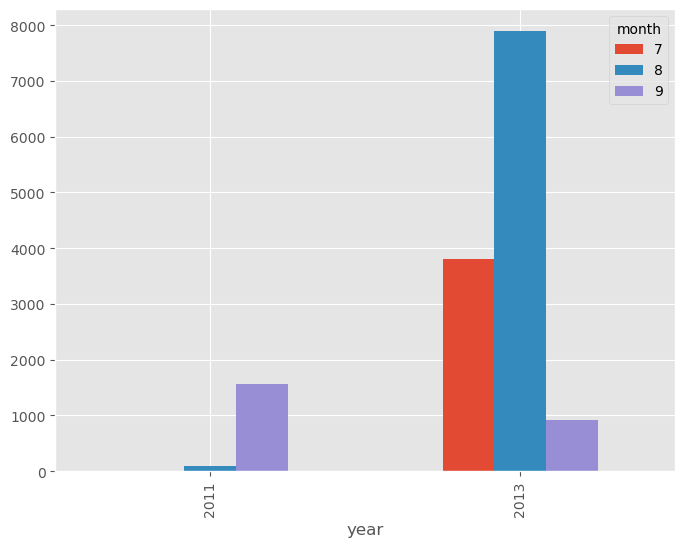

In [64]:
#plot spray data
spray.groupby(['year', 'month']).day.count().unstack(fill_value = 0).plot.bar(figsize = (8,6))

<AxesSubplot:xlabel='year'>

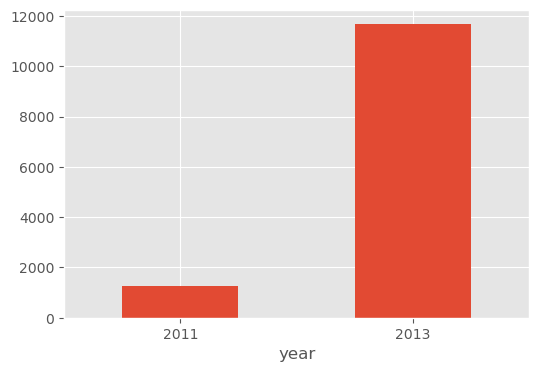

In [65]:
# Plot the number of unique locations spray conducted in each year (2011,2013)
uniquelocsprayed = spray.groupby(by = 'year')['latitude'].nunique().plot.bar(figsize=(6,4))
#uniquelocsprayed.sort_values(ascending = False)
uniquelocsprayed.plot(kind = 'bar', title = 'Number of locations sprays conducted in each year')
plt.xticks(rotation = 0);
uniquelocsprayed

<b>Effects of spray</b>

In [66]:
# Scatterplot of Spray vs virus and mosquito count
fig = px.scatter_mapbox(spray, lat = 'latitude', lon  = 'longitude',
                        size_max=15, zoom = 9,color_discrete_sequence=['#FECB52'],  opacity = 0.5)

fig2 = px.scatter_mapbox(exploratory_data, lat = 'latitude', lon  = 'longitude', 
                        color = 'nummosquitos', size = 'wnvpresent', 
                        color_continuous_scale=px.colors.sequential.Jet,
                        hover_data = ['nummosquitos', 'wnvpresent'], zoom = 9)

fig.add_trace(fig2.data[0],)

fig.update_layout( title = 'Spray - West Nile Virus and Mosquito clusters', mapbox_style="open-street-map",
                  width=600, height=600)

The above plot shows that areas that were sprayed have low virus count, which indicate that spraying is effective. However, some crucial areas were not sprayed which leads to have higher virus count in that area.

In [67]:
# Scatterplot to show spray vs virus in percentage 
fig = px.scatter_mapbox(spray, lat = 'latitude', lon  = 'longitude',
                        size_max=15, zoom = 9,color_discrete_sequence=['#FECB52'],  opacity = 0.5)

fig2 = px.scatter_mapbox(exploratory_data, lat = 'latitude', lon  = 'longitude',
                        size = 'virus_pct', zoom = 9)

fig.add_trace(fig2.data[0],)

fig.update_layout( title = 'Spray Vs Virus%', mapbox_style="open-street-map", width=600, height=600)

Spraying reduced both mosquito count and virus count but percentage of virus is high in the sprayed area, which may be due to fact that spray is not so effective against mosquito that spread WN virus.

- The spray dataset has only provided us with data for the years 2011 and 2013 for the months of July, August and September.

- 2013 has more sprays conducted in July and August as compared to 2011, and at more locations.

/var/folders/_s/2k6c2y293tl37khbd17nwl100000gn/T/ipykernel_41773/3923686496.py:2: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



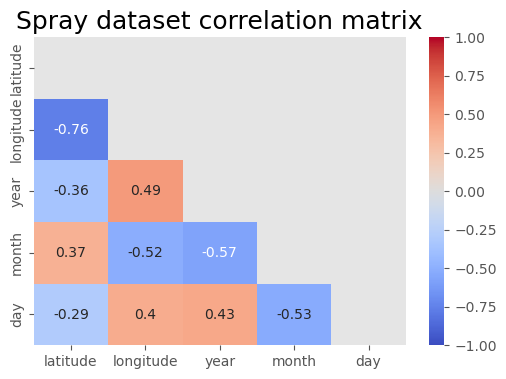

In [68]:
corr = spray.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool))
plt.figure(figsize=(6,4))
plt.title('Spray dataset correlation matrix',fontsize = 18)
sns.heatmap(data = corr, vmin = -1, vmax=1, annot=True, mask = mask, cmap='coolwarm');

In [69]:
#get spray dates and sort by year
spray_dates = spray['date'].unique()
spray_2011 = spray_dates[:2]
spray_2013 = spray_dates[2:]

In [70]:
wnv_2011 = train[train['date'].dt.year==2011].groupby('date')['wnvpresent'].sum()
wnv_2013 = train[train['date'].dt.year==2013].groupby('date')['wnvpresent'].sum()
mosquitos_2011 = train[train['date'].dt.year==2011].groupby('date')['nummosquitos'].sum()
mosquitos_2013 = train[train['date'].dt.year==2013].groupby('date')['nummosquitos'].sum()

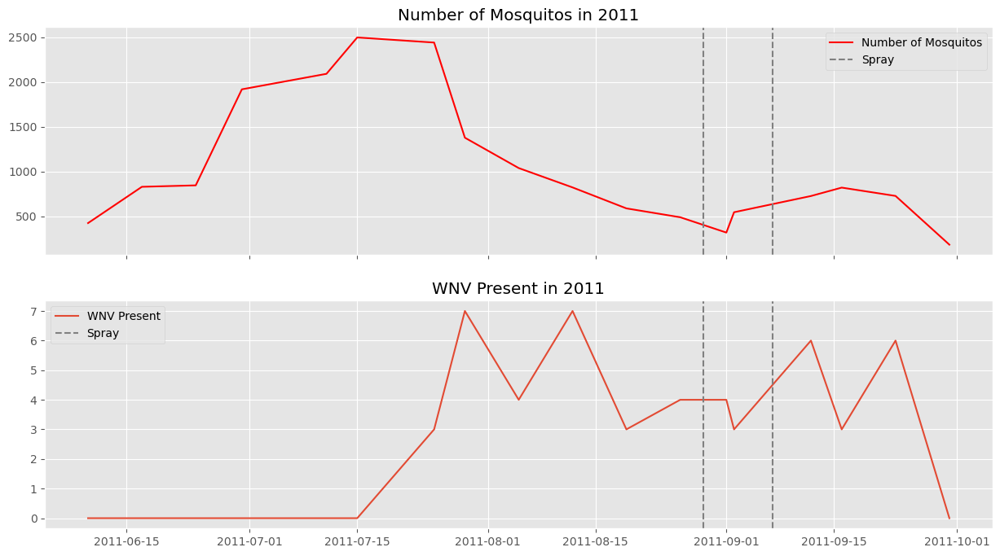

In [71]:
fig, axes = plt.subplots(nrows=2,sharex=True, figsize=(15,8))

axes[0].plot(mosquitos_2011.index,mosquitos_2011.values,color='red')
for spray_date in spray_2011:
    axes[0].axvline(x=spray_date, color='grey', ls='--')
axes[0].set_title('Number of Mosquitos in 2011')
axes[0].legend(['Number of Mosquitos','Spray']);

axes[1].plot(wnv_2011.index,wnv_2011.values)
for spray_date in spray_2011:
    axes[1].axvline(x=spray_date, color='grey', ls='--')
axes[1].set_title('WNV Present in 2011')
axes[1].legend(['WNV Present','Spray']);

**Observations for 2011:**

- From the above graphs, we can see that the trending of mosquito numbers with West Nile Virus does not seem to be affected by the spraying efforts that were carried out. 
- The graph may not accurately depict the effectiveness of the spray as the location of spray does not seem to coincide with the location of trap. 

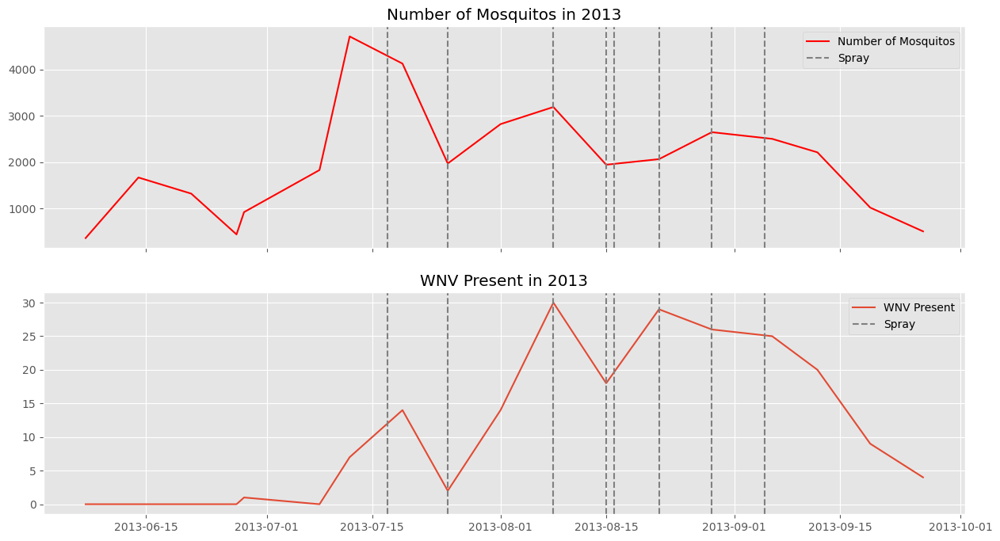

In [72]:
fig, axes = plt.subplots(nrows=2,sharex=True, figsize=(15,8))

axes[0].plot(mosquitos_2013.index,mosquitos_2013.values,color='red',label='Number of Mosquitos')
for spray_date in spray_2013:
    axes[0].axvline(x=spray_date, color='grey', ls='--')
axes[0].set_title('Number of Mosquitos in 2013');
axes[0].legend(['Number of Mosquitos','Spray'], loc=1);
# ax2.legend(loc=1)

axes[1].plot(wnv_2013.index,wnv_2013.values)
for spray_date in spray_2013:
    axes[1].axvline(x=spray_date, color='grey', ls='--')
axes[1].set_title('WNV Present in 2013');
axes[1].legend(['WNV Present','Spray']);

**Observations for 2013:**

As we can see in the week of 15-Jul-2013, the number of mosquitos decreased after the first spray. However, the 2nd spray did not seem to reduce the mosquito population. Instead both mosquito population and WNV virus increased sharply after that.

Next, we will look at the coverage of the sprays made on each day. We can also see whether the spray covered the traps.

In [73]:
#Create locations for trap (with longitude and latitude) in train data
trap_lat_long = []

for trap in train['trap'].unique():
    lat = train.loc[train['trap'] == trap, 'latitude'].values[0]
    long = train.loc[train['trap']== trap, 'longitude'].values[0]
    trap_lat_long.append([trap, (lat,long)])

In [74]:
trap_lat_long

[['T048', (41.867108, -87.654224)],
 ['T091', (41.862292, -87.64886)],
 ['T049', (41.896282, -87.655232)],
 ['T153', (41.907645, -87.760886)],
 ['T045', (41.9216, -87.666455)],
 ['T094', (41.720848, -87.666014)],
 ['T050', (41.919343, -87.694259)],
 ['T054', (41.921965, -87.632085)],
 ['T086', (41.688324, -87.676709)],
 ['T096', (41.731922, -87.677512)],
 ['T046', (41.891118, -87.654491)],
 ['T002', (41.95469, -87.800991)],
 ['T007', (41.994991, -87.769279)],
 ['T143', (41.999129, -87.795585)],
 ['T148', (42.01743, -87.687769)],
 ['T015', (41.974089, -87.824812)],
 ['T159', (41.732984, -87.649642)],
 ['T129', (41.891126, -87.61156)],
 ['T092', (41.869216, -87.627561)],
 ['T033', (41.906638, -87.701431)],
 ['T149', (41.994469, -87.667736)],
 ['T150', (42.006858, -87.675919)],
 ['T154', (41.918705, -87.752329)],
 ['T152', (41.846075, -87.716277)],
 ['T147', (41.932094, -87.700117)],
 ['T158', (41.682587, -87.707973)],
 ['T011', (41.944869, -87.832763)],
 ['T218', (41.948167, -87.730698)]

In [75]:
#for spray data, creating longitude and latitude list
spray_lat_long = []

for date in spray['date'].unique():
    location = []
    for i, row in spray[spray['date']== date].iterrows():
        location.append([row['latitude'], row['longitude']])
    spray_lat_long.append(location)
    

In [76]:
spray_lat_long

[[[42.3916233333333, -88.0891633333333],
  [42.3913483333333, -88.0891633333333],
  [42.3910216666667, -88.0891566666667],
  [42.3906366666667, -88.0891583333333],
  [42.39041, -88.0888583333333],
  [42.390395, -88.088315],
  [42.3906733333333, -88.0880016666667],
  [42.3910266666667, -88.0880016666667],
  [42.3914033333333, -88.0880033333333],
  [42.3917183333333, -88.087995],
  [42.3920383333333, -88.0879883333333],
  [42.39241, -88.0880783333333],
  [42.3928, -88.0883316666667],
  [42.3932566666667, -88.08837],
  [42.3936, -88.0882316666667],
  [42.3932033333333, -88.0884166666667],
  [42.3927916666667, -88.0883116666667],
  [42.3924766666667, -88.08821],
  [42.392385, -88.0886966666667],
  [42.3920983333333, -88.0891133333333],
  [42.39218, -88.0894983333333],
  [42.3924283333333, -88.08979],
  [42.3927216666667, -88.0900416666667],
  [42.3929583333333, -88.0903],
  [42.39299, -88.090895],
  [42.3930016666667, -88.0916116666667],
  [42.3930083333333, -88.09201],
  [42.39302, -88.09

In [77]:
#create dataframe with nummosquitos at each date and trap

date_mosq = train.groupby(['date', 'trap', 'wnvpresent'], as_index = False).sum()
date_mosq = date_mosq.loc[date_mosq['wnvpresent']==1]

date_mosq = date_mosq.loc[date_mosq['date'].dt.year >= 2013]
date_mosq.head()

,date,trap,wnvpresent,species,latitude,longitude,year,month,day,nummosquitos
3870,2013-06-28,T094,1,2.0,41.720848,-87.666014,2013,6,28,38
3957,2013-07-12,T008,1,3.0,84.016628,-175.555842,4026,14,24,78
3984,2013-07-12,T073,1,1.0,41.773215,-87.600880,2013,7,12,9
4007,2013-07-12,T158,1,1.0,41.682587,-87.707973,2013,7,12,36
4009,2013-07-12,T159,1,2.0,41.732984,-87.649642,2013,7,12,27


In [78]:
date_mosq.shape

(169, 10)

In [79]:
#for number of mosquitos, extract longitude and latitude for mapping
mosq_lat_long = []

for date in date_mosq['date'].unique():
    location = []
    for i, row in date_mosq[date_mosq['date'] == date].iterrows():
        location.append([row['latitude'], row['longitude']])
    mosq_lat_long.append(location)

In [80]:
mosq_lat_long

[[[41.720848, -87.666014]],
 [[84.016628, -175.555842],
  [41.773215, -87.60088],
  [41.682587, -87.707973],
  [41.732984, -87.649642],
  [41.951866, -87.725057],
  [41.98728, -87.666066]],
 [[41.964242, -87.757639],
  [42.008314, -87.777921],
  [41.923738, -87.785288],
  [41.89923, -87.716788],
  [41.801498, -87.763416],
  [41.867108, -87.654224],
  [41.704572, -87.565666],
  [41.743402, -87.731435],
  [41.793818, -87.654234],
  [83.903732, -175.450114],
  [41.904194, -87.756155],
  [83.949378, -175.78123]],
 [[41.921965, -87.632085], [41.766202, -87.562889]],
 [[41.964242, -87.757639],
  [41.923738, -87.785288],
  [41.89923, -87.716788],
  [41.720848, -87.666014],
  [125.79628199999999, -263.10035100000005],
  [41.659112, -87.538693],
  [41.947227, -87.671457],
  [83.486804, -175.46287],
  [41.728495, -87.600963],
  [41.98728, -87.666066],
  [41.974689, -87.890615]],
 [[83.90938, -175.601982],
  [41.964242, -87.757639],
  [41.992478, -87.862995],
  [41.944869, -87.832763],
  [83.8474

In [81]:
#plot the map for spraying efforts
#blue dots for trap locations

fig = Figure(width=850, height=550)
m = folium.Map(location=[41.9, -87.7], zoom_start=9, min_zoom=9, max_zoom=11, tiles='cartodbdark_matter')
fig.add_child(m)

gradient = {.33: 'blue', .66: 'green', 1: 'yellow'}
HeatMapWithTime(spray_lat_long, index=list(np.datetime_as_string(spray['date'].unique(), unit ='D')), 
                radius=0.03, gradient=gradient, position='bottomright', 
                name='spray_zones', scale_radius=True).add_to(m)

    
for item in trap_lat_long:
    folium.CircleMarker(item[1], radius=1).add_to(m)


m

In [82]:
# Plot the map for number of mosquitoes
# Blue dots indicate the trap locations
fig = Figure(width=850, height=550)
m2 = folium.Map(location=[41.9, -87.7], zoom_start=9, min_zoom=9, max_zoom=11, tiles='cartodbdark_matter')
fig.add_child(m2)

gradient = {.33: 'blue', .66: 'yellow', 1: 'red'}
HeatMapWithTime(mosq_lat_long, index=list(np.datetime_as_string(date_mosq['date'].unique(), unit='D')), 
                gradient=gradient, radius=20, position='bottomright').add_to(m2)

for item in trap_lat_long:
    folium.CircleMarker(item[1], radius=1).add_to(m2)

m2

From the two heat maps, we are able to clearly see the coverage of the spray on each given date and which traps are nearby the spray zone. Given that we only have 10 unique spray dates, there is insufficient data to substantiate the effect of spray on the mosquito population. From a modelling point of view, the lack of data makes it difficult for our model to train proper. In this case, we may propose to look into the weather dataset which contains more information, for our modelling.

<b>Exporting to csv</b>

In [83]:
# Save cleaned train dataset as a csv file
spray.to_csv('../data/spray_cleaned.csv', index=False)

[Back to top](#1)